In [1]:
import os, sys
# os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import tensorflow as tf
print(f"TensorFlow version: {tf.__version__}")
tf.compat.v1.enable_eager_execution()

import numpy as np
import imageio
import pprint

import matplotlib.pyplot as plt

import run_nerf
import run_nerf_helpers

# double check we have Python 3.7+
assert sys.version_info > (3, 7), f"You need at least Python 3.7 to run this notebook"


TensorFlow version: 2.7.0


### Load trained network weights
Run `bash download_example_weights.sh` in the root directory if you need to download the Lego example weights
(Note: you will need to ensure `wget` is installed first!)

Args:
expname = lego_example
basedir = ./logs
datadir = ./data/nerf_synthetic/lego
dataset_type = blender

half_res = True
no_batching = True

N_samples = 64
N_importance = 64

use_viewdirs = True

white_bkgd = True

N_rand = 1024

MODEL 63 27 <class 'int'> <class 'int'> True
(None, 90) (None, 63) (None, 27)
MODEL 63 27 <class 'int'> <class 'int'> True
(None, 90) (None, 63) (None, 27)
Not ndc!
Found ckpts ['./logs/lego_example/model_200000.npy']
Reloading from ./logs/lego_example/model_200000.npy
Resetting step to 200001
Reloading fine from ./logs/lego_example/model_fine_200000.npy
Render kwargs:
{'N_importance': 64,
 'N_samples': 64,
 'far': <tf.Tensor: shape=(), dtype=float32, numpy=6.0>,
 'lindisp': False,
 'ndc': False,
 'near': <tf.Tensor: shape=(), dtype=float32, numpy=2.0>,
 'network_fine': <keras.engine.functional.Functional object at 0x7fa2a2c4db10>,
 'network_fn': <keras.engine.functional.Functional object at 0x7fa2a2c5d950>,
 'network_query_fn': <function create_nerf.<locals

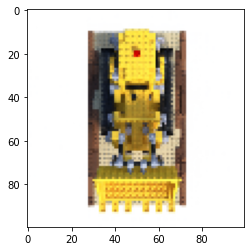

In [2]:
basedir = './logs'
expname = 'lego_example'

config = os.path.join(basedir, expname, 'config.txt')
print('Args:')
print(open(config, 'r').read())

parser = run_nerf.config_parser()
ft_str = '' 
ft_str = '--ft_path {}'.format(os.path.join(basedir, expname, 'model_200000.npy'))
args = parser.parse_args('--config {} '.format(config) + ft_str)

# Create nerf model
_, render_kwargs_test, start, grad_vars, models = run_nerf.create_nerf(args)

bds_dict = {
    'near' : tf.cast(2., tf.float32),
    'far' : tf.cast(6., tf.float32),
}
render_kwargs_test.update(bds_dict)

print('Render kwargs:')
pprint.pprint(render_kwargs_test)

net_fn = render_kwargs_test['network_query_fn']
print(net_fn)

# Render an overhead view to check model was loaded correctly
c2w = np.eye(4)[:3,:4].astype(np.float32) # identity pose matrix
c2w[2,-1] = 4.
H, W, focal = 800, 800, 1200.
down = 8
test = run_nerf.render(H//down, W//down, focal/down, c2w=c2w, **render_kwargs_test)
img = np.clip(test[0],0,1)
plt.imshow(img)
plt.show()

### Query network on dense 3d grid of points

(257, 257, 257, 3)
(257, 257, 257, 4)


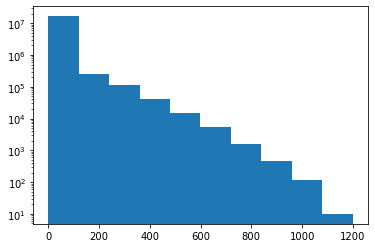

In [3]:
N = 256
t = np.linspace(-1.2, 1.2, N+1)

query_pts = np.stack(np.meshgrid(t, t, t), -1).astype(np.float32)
print(query_pts.shape)
sh = query_pts.shape
flat = query_pts.reshape([-1,3])


def batchify(fn, chunk):
    if chunk is None:
        return fn
    def ret(inputs):
        return tf.concat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], 0)
    return ret
    
    
fn = lambda i0, i1 : net_fn(flat[i0:i1,None,:], viewdirs=np.zeros_like(flat[i0:i1]), network_fn=render_kwargs_test['network_fine'])
chunk = 1024*64
raw = np.concatenate([fn(i, i+chunk).numpy() for i in range(0, flat.shape[0], chunk)], 0)
raw = np.reshape(raw, list(sh[:-1]) + [-1])
sigma = np.maximum(raw[...,-1], 0.)

print(raw.shape)
plt.hist(np.maximum(0,sigma.ravel()), log=True)
plt.show()

### Marching cubes with [PyMCubes](https://github.com/pmneila/PyMCubes)
Change `threshold` to use a different sigma threshold for the isosurface.

Note: make sure `mcubes` is installed first! 

Second note: if you are on macOS, then you won't find this package on Anaconda. But you can still install it via `pip`:

```
conda install pip -y  # pip might already be installed, if you used the environment.yml
pip install PyMCubes
pip install pycollada  # needed for mcubes.export_mesh()
```

In [4]:
import mcubes

threshold = 50.
print('fraction occupied', np.mean(sigma > threshold))
vertices, triangles = mcubes.marching_cubes(sigma, threshold)
print('done', vertices.shape, triangles.shape)

### Uncomment to save out the mesh (as a Collada file)
# mcubes.export_mesh(vertices, triangles, "logs/lego_example/lego_{}.dae".format(N), "lego")

fraction occupied 0.03597676833842202
done (394554, 3) (791052, 3)


### Live preview with [trimesh](https://github.com/mikedh/trimesh)
Click and drag to change viewpoint

In [5]:
import trimesh

mesh = trimesh.Trimesh(vertices / N - .5, triangles)
mesh.show()

/Applications/anaconda3/envs/nerf/lib/python3.7/site-packages/IPython/core/display.py:717: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


### Save out mesh as GLTF

Note to self: using `"gltf"` for the `file_type` parameter below will break `trimesh` (as of version 3.10.0), because it eventually tries to pass a `dict` to the function that writes up your new model file.

So we'll go with saving to the GLB file format - it works and since it is a just single binary file, it usually takes up less space than the equivalent glTF file would:

In [7]:
from trimesh import exchange
# Uncomment to save as a GLB
# exchange.export.export_mesh(mesh, "logs/lego_example/lego.glb", file_type="glb")